<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Explain instruct  PIX2PIX diffusion base</b></div>

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Required Library</b></div>

In [1]:
!git clone https://github.com/huggingface/transformers.git

Cloning into 'transformers'...
remote: Enumerating objects: 240461, done.
remote: Counting objects: 100% (65/65), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 240461 (delta 36), reused 49 (delta 29), pack-reused 240396 (from 1)
Receiving objects: 100% (240461/240461), 252.80 MiB | 30.24 MiB/s, done.
Resolving deltas: 100% (175981/175981), done.


In [2]:
!pip install diffusers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 30.0 MB/s eta 0:00:00


In [3]:
!pip install sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.7/268.7 kB 4.7 MB/s eta 0:00:00


In [4]:
!pip install torch

In [5]:
!pip install pot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.6/865.6 kB 15.7 MB/s eta 0:00:00


In [6]:
from diffusers import DiffusionPipeline, StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
import torch
from PIL import Image
import requests
from io import BytesIO

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sentence_transformers import SentenceTransformer

import os

from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
from IPython.display import display, Image as Image2
import sys
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import requests
import cv2
from sklearn.decomposition import TruncatedSVD

from sklearn.linear_model import LinearRegression
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt
from matplotlib import transforms
import torch
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import chain, combinations
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import wasserstein_distance
from gensim.models import KeyedVectors
from gensim.downloader import load as api_load
from gensim.models import KeyedVectors
from sklearn.metrics.pairwise import euclidean_distances
from scipy.spatial.distance import cdist
from transformers import AutoTokenizer, AutoModel
import torch
import tensorflow as tf
from gensim.models import KeyedVectors
from torch import Generator
import warnings
warnings.filterwarnings('ignore')

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [7]:
#Instruct PIX2PIX
# Initialize the model and pipeline
model_name = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_name, torch_dtype=torch.float16)
device = "cuda"
pipe.to(device)

model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.91k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionInstructPix2PixPipeline {
  "_class_name": "StableDiffusionInstructPix2PixPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "timbrooks/instruct-pix2pix",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [8]:
#DinoV2
processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
model = AutoModel.from_pretrained("facebook/dinov2-base")

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

In [9]:
#Word2Vec model
model_path_bin = '/kaggle/input/google_word__/tensorflow2/default/1/GoogleNews-vectors-negative300.bin'
model_txt = KeyedVectors.load_word2vec_format(model_path_bin, binary=True)


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Inputs</b></div>

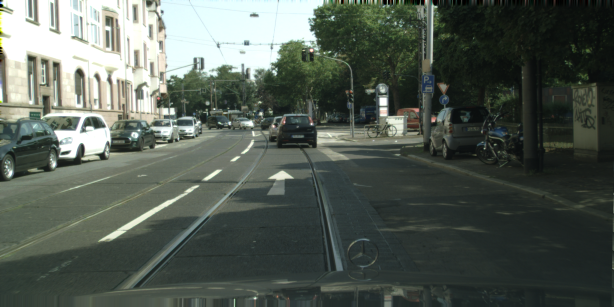

In [10]:
# Load the initial image
url = "/kaggle/input/30images/1(1).png"
init_image = Image.open(url)
display(init_image)

In [11]:
cfg_image = 7.5 # This controls how much the output should resemble the original image
cfg_text = 1.5 # This controls how much the output should follow the text prompt

In [12]:
prompt = "modify it to become as night"
words = prompt.split()
words

['modify', 'it', 'to', 'become', 'as', 'night']

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Generate Original Image with original prompt</b></div>

  0%|          | 0/100 [00:00<?, ?it/s]

Wasserstein distance: 0.06283848008373147


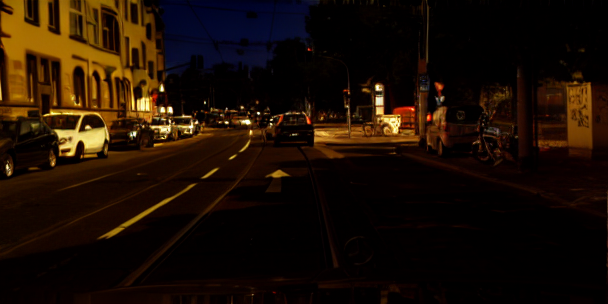

Image generation complete with acceptable Wasserstein distance!


In [13]:
def extract_image_embedding(image, processor, model):
    """Extract embeddings from an image using the DINOv2 model."""
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()
    return embeddings

# Set initial Wasserstein distance to a large number
WD_dist_init = float('inf')

# Repeat generation process until Wasserstein distance is less than 0.1
while WD_dist_init > 0.07:
    # Generate the image
    orig_image = pipe(
        prompt=prompt, 
        image=init_image, 
        cfg_image=cfg_image, 
        cfg_text=cfg_text, 
    ).images[0]
    
    
    # Extract embeddings for the original image and initial image
    orig_embedding = extract_image_embedding(orig_image, processor, model)
    init_embedding = extract_image_embedding(init_image, processor, model)
    
    # Calculate Wasserstein distance between the embeddings
    WD_dist_init = wasserstein_distance(orig_embedding, init_embedding)

    print(f'Wasserstein distance: {WD_dist_init}')

    # Save and display the image only if the distance is acceptable
    if WD_dist_init <= 0.07:
        output_path = '/kaggle/working/orig_image.png'  # Set the output path
        orig_image.save(output_path)
        display(orig_image)

print("Image generation complete with acceptable Wasserstein distance!")


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Generate Perturbaed texts & perturbed Images & compute WD distances between embeddings</b></div>

In [14]:
seed = 1024
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)  # If you're using GPU
torch.backends.cudnn.deterministic = True  # Ensures reproducibility for cuDNN
torch.backends.cudnn.benchmark = False  # Disables the optimized path for better reproducibility
# Set up the text-to-image generator with seed
generator = torch.Generator().manual_seed(seed)

def perturb_text(text_list, perturbation, rng):
    # Initially select items based on perturbation flag
    perturbed_list_initial = [item for item, flag in zip(text_list, perturbation) if flag != 0 and item.strip() != ""]
    
    # Ensure at least two words are included
    if len(perturbed_list_initial) < 2:
        additional_words_needed = 2 - len(perturbed_list_initial)
        available_words = [item for item, flag in zip(text_list, perturbation) if item not in perturbed_list_initial and item.strip() != ""]
        additional_words = rng.choice(available_words, additional_words_needed, replace=False)
        perturbed_list = perturbed_list_initial + list(additional_words)
    else:
        perturbed_list = perturbed_list_initial
    
    return perturbed_list

# Assuming `prompt` and other variables are predefined
words = prompt.split()
text_list = words.copy()

num_perturb = 30
num_words = len(words)

Responses = []
Perturbations = []
# Generate unique perturbations
unique_perturbations = set()
rng = np.random.default_rng(seed)

while len(unique_perturbations) < num_perturb:
    perturbation = tuple(rng.binomial(1, 0.5, size=num_words))  # Convert to tuple for set operations
    
    # Check for uniqueness
    if perturbation not in unique_perturbations:
        unique_perturbations.add(perturbation)
        perturbed_txt = perturb_text(text_list, perturbation, rng)
        corpus = ' '.join(perturbed_txt)
        Responses.append(corpus)  # Store the unique perturbed text
        Perturbations.append(perturbation)  # Store the perturbation vector
        print(f"Perturbation: {perturbation}, Perturbed Text: {corpus}")


Perturbation: (0, 0, 0, 1, 1, 0), Perturbed Text: become as
Perturbation: (1, 1, 1, 0, 1, 0), Perturbed Text: modify it to as
Perturbation: (1, 0, 1, 0, 1, 1), Perturbed Text: modify to as night
Perturbation: (0, 1, 1, 1, 0, 0), Perturbed Text: it to become
Perturbation: (1, 0, 0, 0, 0, 1), Perturbed Text: modify night
Perturbation: (1, 1, 1, 1, 1, 1), Perturbed Text: modify it to become as night
Perturbation: (0, 0, 1, 0, 0, 0), Perturbed Text: to become
Perturbation: (0, 1, 0, 0, 0, 1), Perturbed Text: it night
Perturbation: (1, 1, 0, 0, 1, 1), Perturbed Text: modify it as night
Perturbation: (1, 1, 0, 1, 1, 1), Perturbed Text: modify it become as night
Perturbation: (1, 0, 0, 0, 1, 1), Perturbed Text: modify as night
Perturbation: (0, 0, 0, 0, 0, 0), Perturbed Text: become night
Perturbation: (1, 1, 0, 0, 0, 0), Perturbed Text: modify it
Perturbation: (1, 1, 0, 0, 1, 0), Perturbed Text: modify it as
Perturbation: (0, 1, 0, 1, 1, 1), Perturbed Text: it become as night
Perturbation: (

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 1:
Wasserstein distance (generated vs init): 0.02638921460978358
Wasserstein distance (generated vs orig): 0.00789325857173632


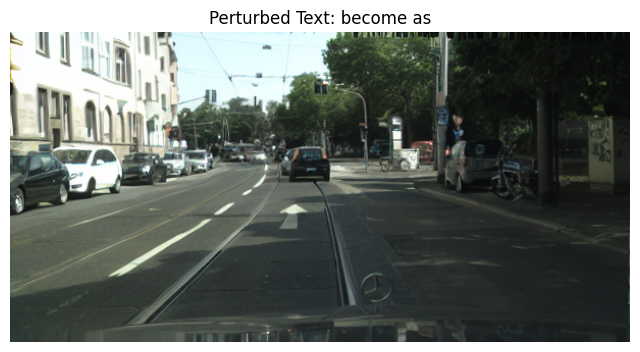

Image generation 1 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 2:
Wasserstein distance (generated vs init): 0.026537581916121183
Wasserstein distance (generated vs orig): 0.00783043914115447


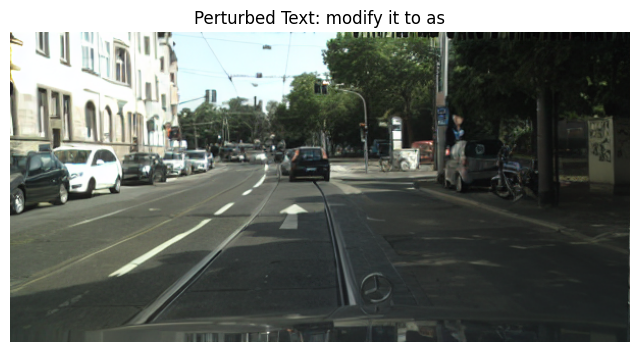

Image generation 2 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 3:
Wasserstein distance (generated vs init): 0.05593852964117711
Wasserstein distance (generated vs orig): 0.018659238561364595


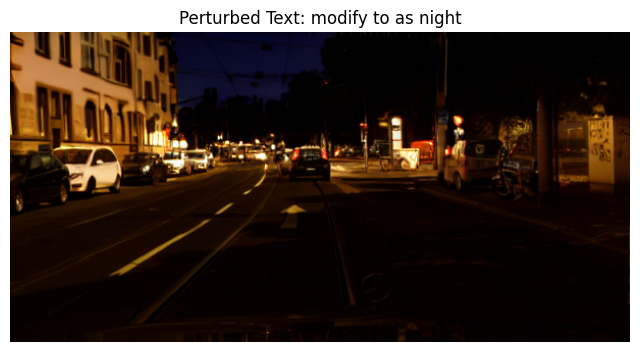

Image generation 3 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 4:
Wasserstein distance (generated vs init): 0.027232850784457696
Wasserstein distance (generated vs orig): 0.03364586267595842


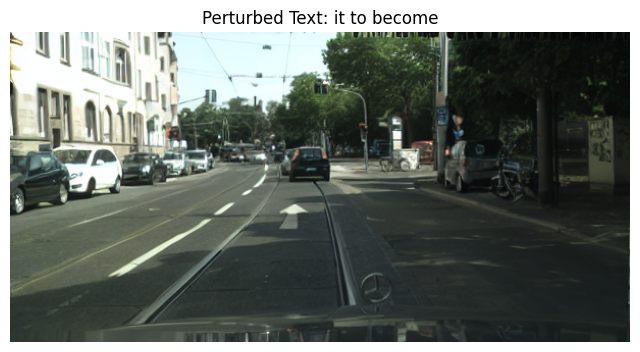

Image generation 4 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 5:
Wasserstein distance (generated vs init): 0.049610142753863336
Wasserstein distance (generated vs orig): 0.02194885508364071


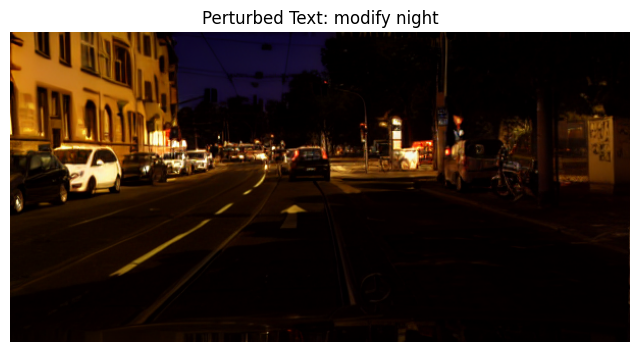

Image generation 5 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 6:
Wasserstein distance (generated vs init): 0.058655553249612545
Wasserstein distance (generated vs orig): 0.027435660227865817


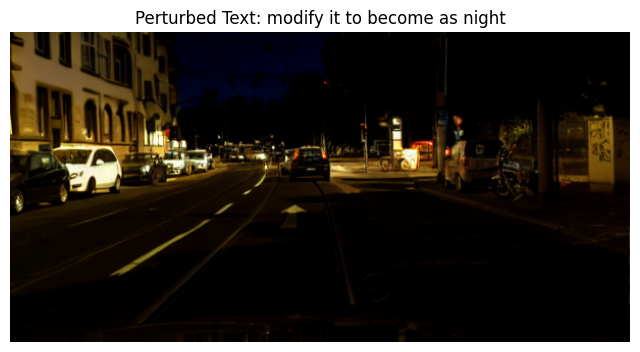

Image generation 6 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 7:
Wasserstein distance (generated vs init): 0.026510651146963937
Wasserstein distance (generated vs orig): 0.007166526437534532


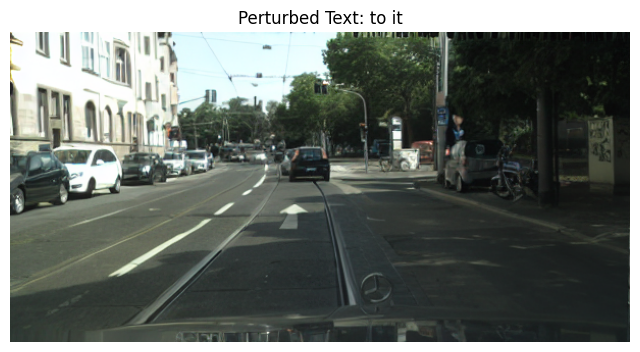

Image generation 7 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 8:
Wasserstein distance (generated vs init): 0.039200113881330864
Wasserstein distance (generated vs orig): 0.018456096333541915


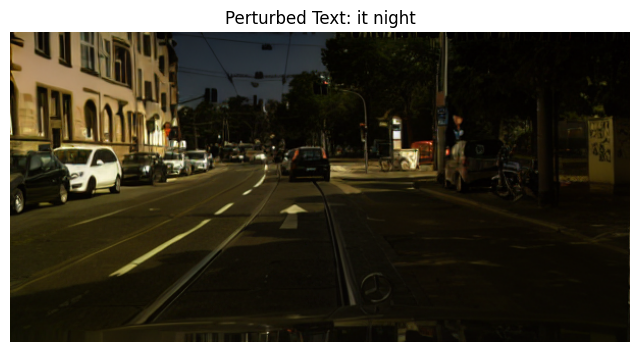

Image generation 8 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 9:
Wasserstein distance (generated vs init): 0.06400485131502859
Wasserstein distance (generated vs orig): 0.0215295308419267


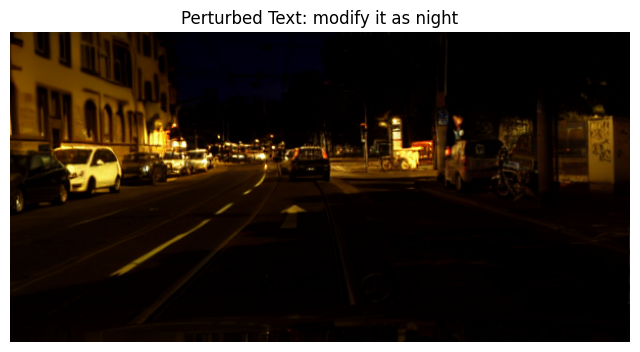

Image generation 9 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 10:
Wasserstein distance (generated vs init): 0.046601855513775575
Wasserstein distance (generated vs orig): 0.03379091813379397


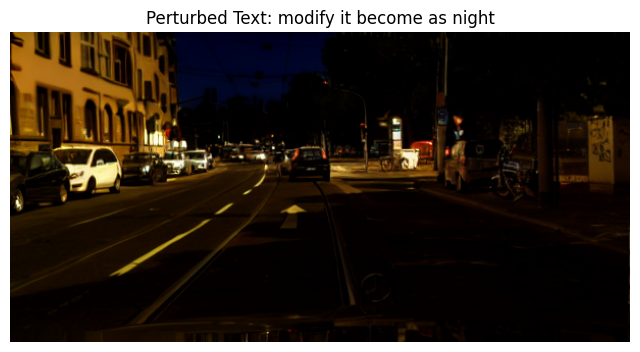

Image generation 10 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 11:
Wasserstein distance (generated vs init): 0.05579333872977562
Wasserstein distance (generated vs orig): 0.021094062194151775


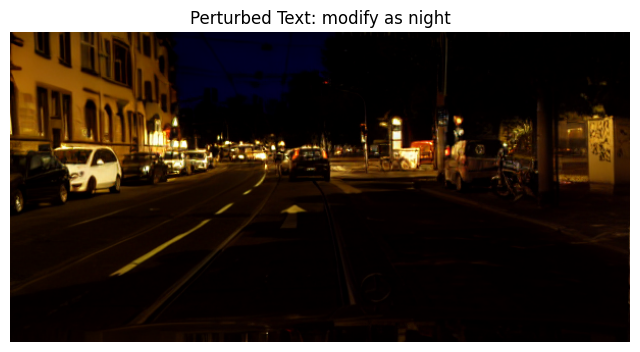

Image generation 11 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 12:
Wasserstein distance (generated vs init): 0.027406105203681367
Wasserstein distance (generated vs orig): 0.0066258748486234306


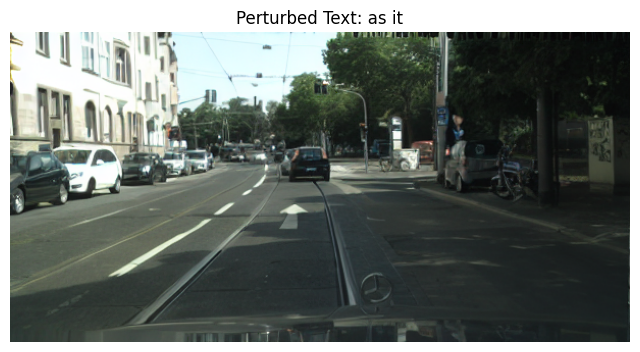

Image generation 12 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 13:
Wasserstein distance (generated vs init): 0.025872729224374787
Wasserstein distance (generated vs orig): 0.00934311110252868


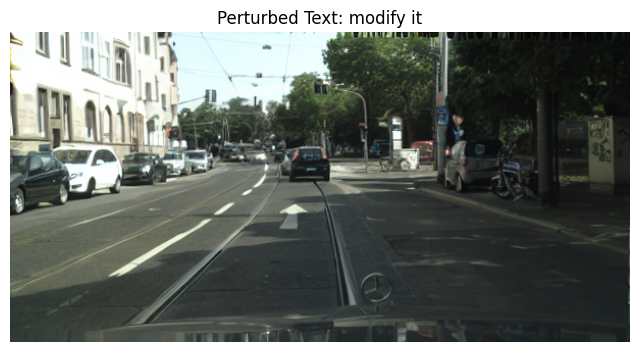

Image generation 13 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 14:
Wasserstein distance (generated vs init): 0.026840890677400846
Wasserstein distance (generated vs orig): 0.008543655523984254


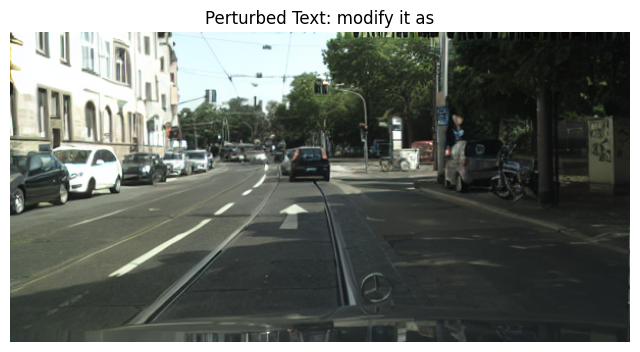

Image generation 14 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 15:
Wasserstein distance (generated vs init): 0.05047923758052282
Wasserstein distance (generated vs orig): 0.021254508426456646


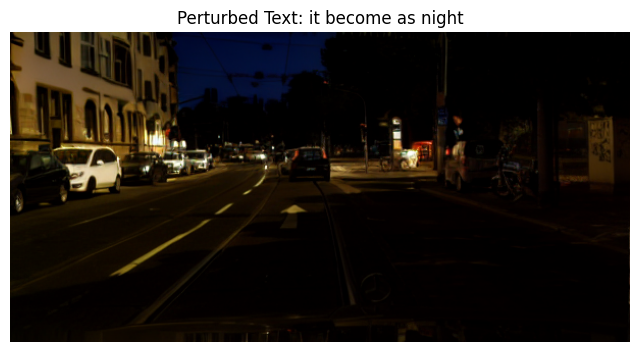

Image generation 15 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 16:
Wasserstein distance (generated vs init): 0.04744016232310365
Wasserstein distance (generated vs orig): 0.017869002234723066


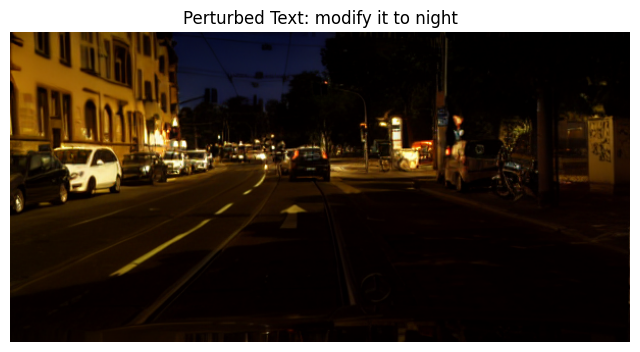

Image generation 16 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 17:
Wasserstein distance (generated vs init): 0.025294435644658136
Wasserstein distance (generated vs orig): 0.01088996985034403


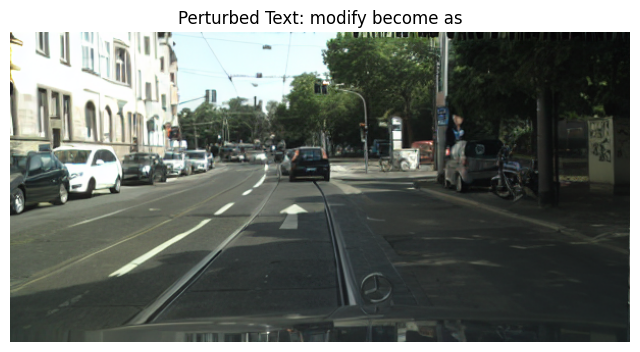

Image generation 17 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 18:
Wasserstein distance (generated vs init): 0.02444105771337491
Wasserstein distance (generated vs orig): 0.00742009772569877


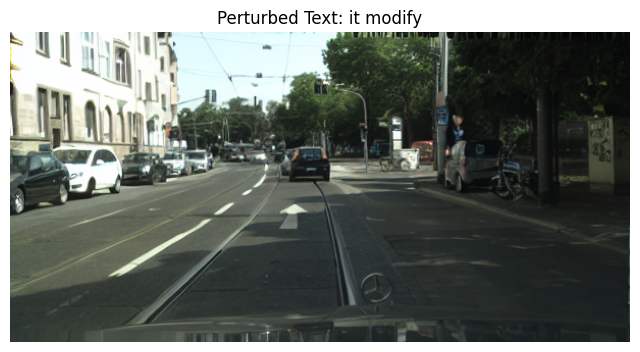

Image generation 18 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 19:
Wasserstein distance (generated vs init): 0.044220534371788765
Wasserstein distance (generated vs orig): 0.017493016824725295


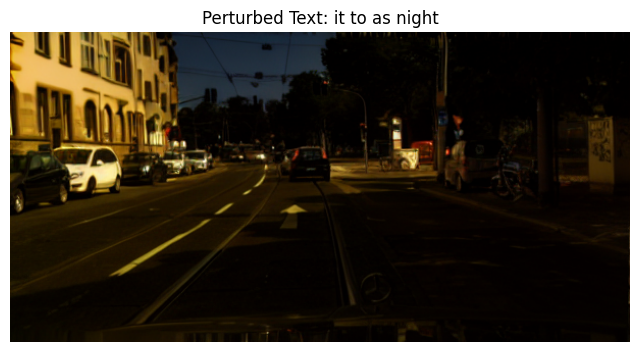

Image generation 19 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 20:
Wasserstein distance (generated vs init): 0.027090090224859878
Wasserstein distance (generated vs orig): 0.007368719962021453


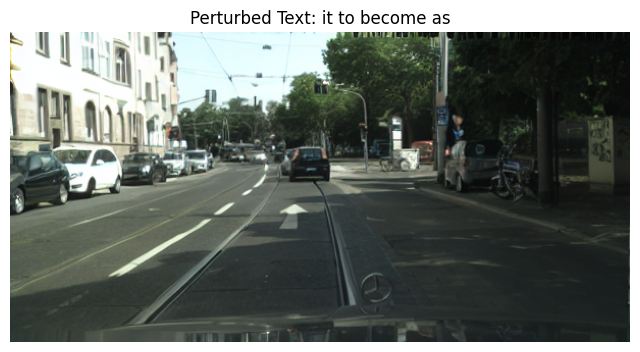

Image generation 20 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 21:
Wasserstein distance (generated vs init): 0.026982950489885596
Wasserstein distance (generated vs orig): 0.00625690376476011


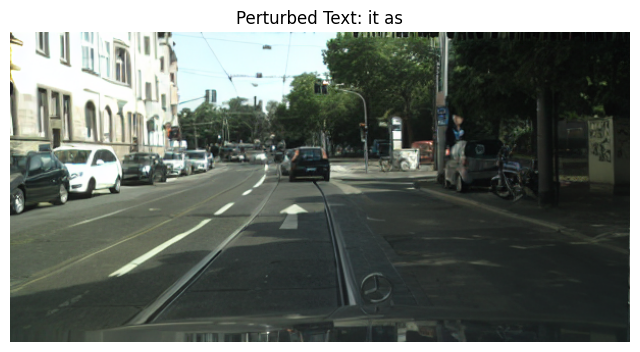

Image generation 21 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 22:
Wasserstein distance (generated vs init): 0.041663514734257966
Wasserstein distance (generated vs orig): 0.017970311485896673


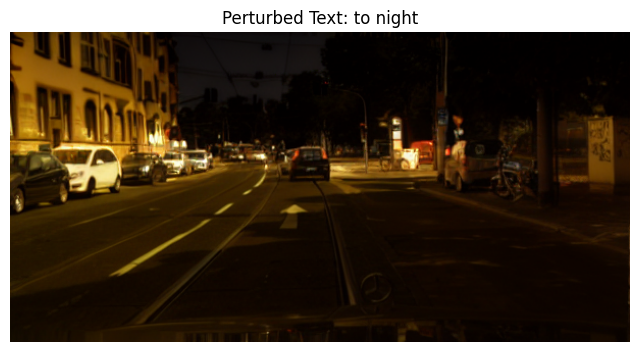

Image generation 22 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 23:
Wasserstein distance (generated vs init): 0.04315742285659024
Wasserstein distance (generated vs orig): 0.026666985703135058


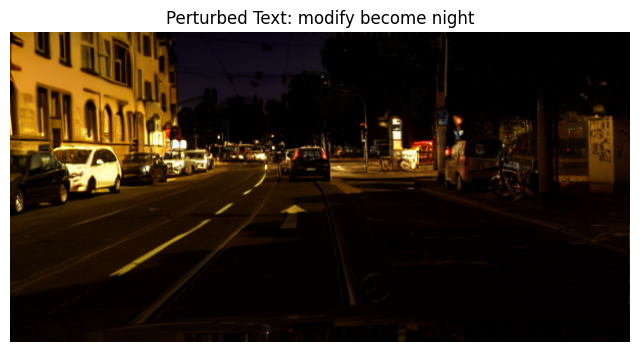

Image generation 23 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 24:
Wasserstein distance (generated vs init): 0.026210737016981518
Wasserstein distance (generated vs orig): 0.00810424275137696


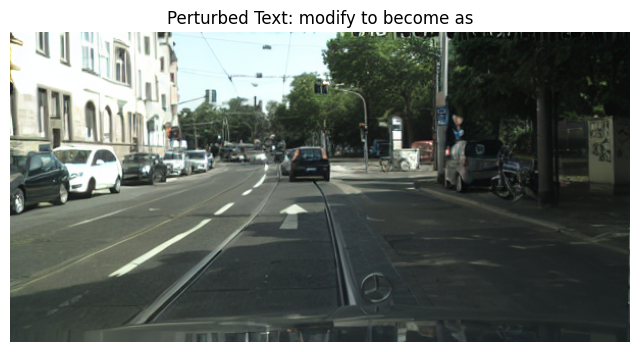

Image generation 24 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 25:
Wasserstein distance (generated vs init): 0.04570840481475596
Wasserstein distance (generated vs orig): 0.01724587241053162


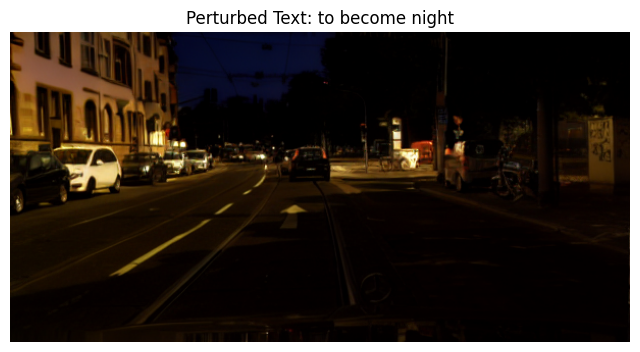

Image generation 25 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 26:
Wasserstein distance (generated vs init): 0.026501278225623558
Wasserstein distance (generated vs orig): 0.007956867355725691


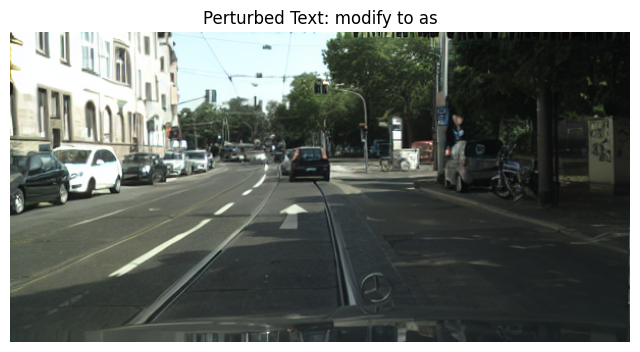

Image generation 26 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 27:
Wasserstein distance (generated vs init): 0.026697421860869035
Wasserstein distance (generated vs orig): 0.007230042224061134


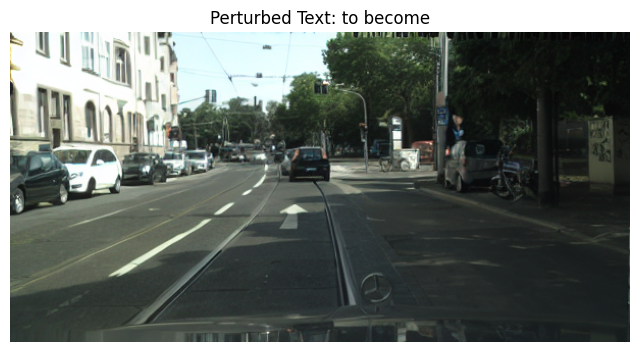

Image generation 27 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 28:
Wasserstein distance (generated vs init): 0.05134230017453474
Wasserstein distance (generated vs orig): 0.0191577402929397


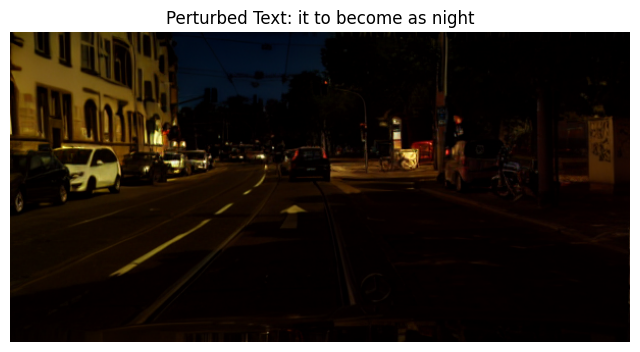

Image generation 28 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 29:
Wasserstein distance (generated vs init): 0.027586235088165274
Wasserstein distance (generated vs orig): 0.006698268616522305


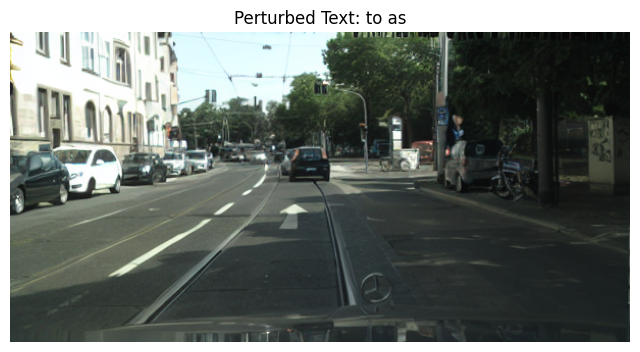

Image generation 29 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 30:
Wasserstein distance (generated vs init): 0.03589740240219422
Wasserstein distance (generated vs orig): 0.01568553120959064


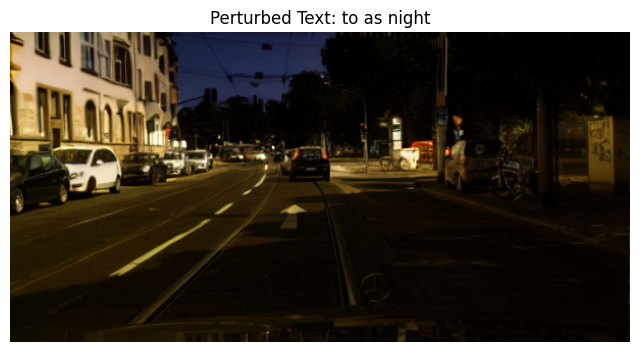

Image generation 30 complete with acceptable Wasserstein distance!


In [15]:
epsilon = 1e-6  # A small value to prevent division by zero
WD_dists_generated_vs_orig = []  # List to store Wasserstein distances

for i, perturbation in enumerate(Perturbations):
    # Generate new text for each perturbation
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    
    # Set initial Wasserstein distances for generated image
    WD_dist_generated = float('inf')
    WD_dist_generated_vs_orig_value = float('inf')  # Distance between generated_image and orig_image (temporarily stored inside the loop)

    # Repeat generation process
    while WD_dist_generated > 0.07:  
        # Generate the original image (once, if not already generated)
        orig_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text,
        ).images[0]

        # Generate another image (generated image)
        generated_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text,
        ).images[0]

        # Extract embeddings for the generated image, original image, and initial image
        generated_embedding = extract_image_embedding(generated_image, processor, model)
        init_embedding = extract_image_embedding(init_image, processor, model)
        orig_embedding = extract_image_embedding(orig_image, processor, model)

        # Calculate Wasserstein distance between generated image and initial image
        WD_dist_generated = wasserstein_distance(generated_embedding, init_embedding)

        if WD_dist_generated > 0.07:
            print(f"Distance too large (WD_dist_generated = {WD_dist_generated}), regenerating image...")
            continue  # Go back to the beginning of the loop to regenerate the image

        # Calculate Wasserstein distance between generated image and original image
        WD_dist_generated_vs_orig_value = wasserstein_distance(generated_embedding, orig_embedding)

        # Store the Wasserstein distance between the generated image and the original image
        WD_dists_generated_vs_orig.append(WD_dist_generated_vs_orig_value)

        # Display the Wasserstein distances
        print(f"Perturbation {i + 1}:")
        print(f'Wasserstein distance (generated vs init): {WD_dist_generated}')
        print(f'Wasserstein distance (generated vs orig): {WD_dist_generated_vs_orig_value}')

        # Display the image only if the distance is acceptable
        plt.figure(figsize=(8, 8))
        plt.imshow(generated_image)
        plt.title(f"Perturbed Text: {corpus}", fontsize=12)
        plt.axis('off')  # Remove the axes
        plt.show()

        # Save the image to the output path if the distance is acceptable
        output_path = f'/kaggle/working/generated_image_{i + 1}.png'  # Set the output path for each image
        generated_image.save(output_path)
        print(f"Image generation {i + 1} complete with acceptable Wasserstein distance!")
        break  # Exit the loop if the image is acceptable


[0.0594303  0.05714878 0.45043685 0.99473177 0.5699115  0.7691852
 0.03303633 0.44305899 0.55468218 1.         0.53886652 0.01340056
 0.11208708 0.08305188 0.54469372 0.42173649 0.168267   0.04224571
 0.40808118 0.04037973 0.         0.42541591 0.74126793 0.06709298
 0.39910521 0.06174049 0.03534314 0.4685418  0.0160298  0.34243563]
WMD Scores:

Original vs Perturbed 1: 0.5650
Original vs Perturbed 2: 0.3208
Original vs Perturbed 3: 0.2106
Original vs Perturbed 4: 0.3570
Original vs Perturbed 5: 0.3253
Original vs Perturbed 6: 0.0000
Original vs Perturbed 7: 0.4680
Original vs Perturbed 8: 0.5817
Original vs Perturbed 9: 0.2674
Original vs Perturbed 10: 0.0735
Original vs Perturbed 11: 0.2975
Original vs Perturbed 12: 0.3208
Original vs Perturbed 13: 0.3866
Original vs Perturbed 14: 0.3696
Original vs Perturbed 15: 0.2184
Original vs Perturbed 16: 0.2636
Original vs Perturbed 17: 0.3331
Original vs Perturbed 18: 0.3866
Original vs Perturbed 19: 0.4497
Original vs Perturbed 20: 0.3253
O

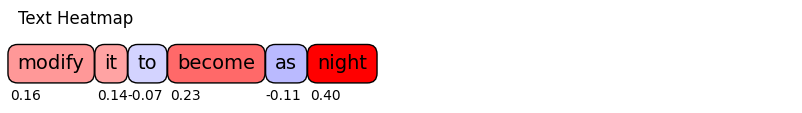

In [16]:
WD_dists_generated_vs_orig = np.array(WD_dists_generated_vs_orig)

# Step 2: Scale the inverse distances between 0 and 1 (Min-Max scaling)
min_WD = np.min(WD_dists_generated_vs_orig)
max_WD = np.max(WD_dists_generated_vs_orig)

Similarities = (WD_dists_generated_vs_orig - min_WD) / (max_WD - min_WD)

# Now Similarities contains the scaled similarities between 0 and 1
print(Similarities)

wmd_scores = {}
all_texts = [prompt] + Responses  # Include the original text (prompt) and all responses (perturbed texts)

for idx, text in enumerate(Responses):  # Loop through all perturbed texts (Responses)
    wmd_score = model_txt.wmdistance(prompt, text)  # Compute WMD between prompt and perturbed text
    wmd_scores[f"Original vs Perturbed {idx+1}"] = wmd_score

# Display the WMD scores
print("WMD Scores:\n")
for key, value in wmd_scores.items():
    print(f"{key}: {value:.4f}")

# Assigning WMD scores to a variable 'distances' for future use
distances = wmd_scores

Perturbations = np.vstack(Perturbations)
distance_values = np.array(list(distances.values()))

kernel_width = 0.25

# Compute weights based on the distances
weights = np.sqrt(np.exp(-(distance_values ** 2) / (kernel_width ** 2)))

# Fit a Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X=Perturbations, y=Similarities, sample_weight=weights)

# Retrieve coefficients from the model
coefficients = linear_model.coef_

# Print the coefficients and weights
print("Coefficients from the Linear Regression model:", coefficients)
print("\nComputed Weights:", weights)

# Function to plot text heatmap
def plot_text_heatmap(words, scores, title="", width=10, height=0.4, verbose=0, max_word_per_line=20, word_spacing=20, score_fontsize=10, save_path=None):
    fig = plt.figure(figsize=(width, height))
    ax = plt.gca()
    ax.set_title(title, loc='left')
    cmap = plt.cm.ScalarMappable(cmap=plt.cm.bwr)
    cmap.set_clim(0, 1)
    canvas = ax.figure.canvas
    t = ax.transData
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    loc_y = -0.2
    for i, (token, score) in enumerate(zip(words, scores)):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = '#%02x%02x%02x' % tuple(rgb)
        text = ax.text(0.0, loc_y, token, bbox={'facecolor': color, 'pad': 5.0, 'linewidth': 1, 'boxstyle': 'round,pad=0.5'}, transform=t, fontsize=14)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        score_text = ax.text(0.01, loc_y - 1, f"{score:.2f}", transform=t, fontsize=score_fontsize, ha='center')
        score_text.draw(canvas.get_renderer())
        ex_score = score_text.get_window_extent()
        if (i+1) % max_word_per_line == 0:
            loc_y -= 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + word_spacing, units='dots')
    if verbose == 0:
        ax.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

# Define the words for heatmap and save path
words = prompt.split(' ')
save_path = '/kaggle/working/text_heatmap.png'

# Call the function with the save path
plot_text_heatmap(words, coefficients, title="Text Heatmap", save_path=save_path)
